https://fxburk.medium.com/machine-classification-of-emotional-speech-with-emodb-and-python-25a67753210e


In [ ]:
!rm -rf audeeremodb/
!git clone https://github.com/beltrewilton/audeeremodb.git

Cloning into 'audeeremodb'...
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 18 (delta 6), reused 15 (delta 3), pack-reused 0
Unpacking objects: 100% (18/18), 4.28 KiB | 876.00 KiB/s, done.


In [ ]:
!pip install -r audeeremodb/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 KB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 34.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.4/167.4 KB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 494.3/494.3 KB 16.6 MB/s eta 0:00:00
  Created wheel for iso-639: filename=iso_639-0.4.5-py3-none-any.whl size=168853 sha256=5d1a1d3e2fa16ab4a609a0ef55df5fed37f8ebc95d4a7e9fc4355837d0ca0083
  Stored in directory: /root/.cache/pip/wheels/43/3f/de/07f35ac2a2cd11ff30224e3fc6fbf458d7fc95effb1f673431
Successfully built iso-639
  Attempting uninstall: pandas
    Found existing installation: pandas 1.4.4
    Uninstalling pandas-1.4.4:
      Successfully uninstalled pandas-1.4.4


In [ ]:
!python audeeremodb/create_feature_database.py

In [ ]:
import opensmile
import audformat
import os


db = audformat.Database.load('./emodb')
db

name: emodb
description: Berlin Database of Emotional Speech. A German database of emotional utterances
  spoken by actors recorded as a part of the DFG funded research project SE462/3-1
  in 1997 and 1999. Recordings took place in the anechoic chamber of the Technical
  University Berlin, department of Technical Acoustics. It contains about 500 utterances
  from ten different actors expressing basic six emotions and neutral.
source: http://emodb.bilderbar.info/download/download.zip
usage: unrestricted
languages: [deu]
media:
  microphone: {type: other, format: wav, channels: 1, sampling_rate: 16000}
raters:
  gold: {type: human}
schemes:
  age: {description: Age of speaker, dtype: int, minimum: 0}
  confidence: {description: Confidence of emotion ratings., dtype: float, minimum: 0,
    maximum: 1}
  emotion:
    description: Six basic emotions and neutral.
    dtype: str
    labels: [anger, boredom, disgust, fear, happiness, sadness, neutral]
  gender:
    description: Gender of speak

In [ ]:
import os


root = '/content/emodb/'
db.map_files(lambda x: os.path.join(root, x))


<Axes: ylabel='emotion'>

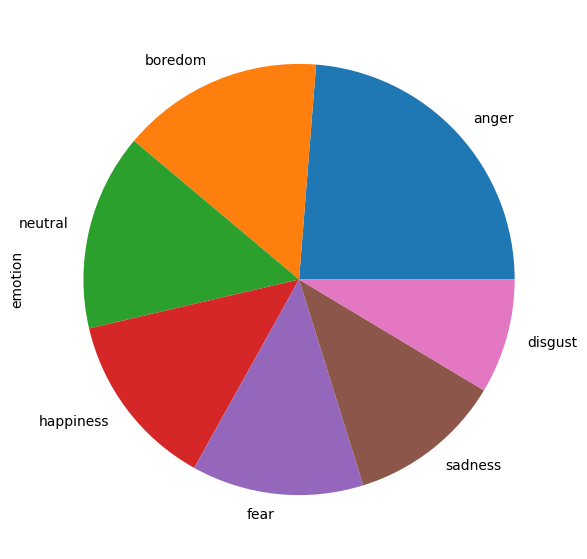

In [ ]:
db.tables['emotion'].df.index[0]
df = db.tables['emotion'].df

df_emo = db.tables['emotion'].df
df_files = db.tables['files'].df

df.emotion.value_counts().plot(kind='pie', figsize=(7, 7))


In [ ]:
import opensmile


smile = opensmile.Smile(
    feature_set=opensmile.FeatureSet.GeMAPSv01b,
    feature_level=opensmile.FeatureLevel.Functionals,
)


In [ ]:
# take long time.
feats_df = smile.process_files(df.index)

# demo_audio_df = smile.process_files(['/content/demo_audio.wav'])


(1, 62)

In [ ]:
feats_df.shape

(535, 62)

In [ ]:
# random it.

df_full = feats_df.join(df)

test_labels = df.iloc[:100,].emotion
train_labels = df.iloc[100:,].emotion
test_feats = feats_df.iloc[:100,]
train_feats = feats_df.iloc[100:,]



In [ ]:
import base64
import IPython
from IPython.display import HTML, display_html
import pandas as pd
pd.set_option('display.max_colwidth', -1)

copy_feats = df_full.sample(5)

def table_with_sound(dframe, pred=False):
  def path_to_sound_html(sound):
    encode_string = base64.b64encode(open(sound.name[0], "rb").read())
    encode_string = encode_string.decode("utf-8")
    encode_string = 'data:audio/x-wav;base64,' +  encode_string
    return f'<audio controls ><source src={encode_string} type="audio/x-wav" />Your browser sucks!</audio> '

  dframe['audio_column'] = dframe.apply(path_to_sound_html, axis=1)

  _columns = ['audio_column', 'emotion', 'emotion.confidence']
  if pred:
    _columns.append('emotion_predicted')

  return HTML(dframe[_columns].to_html(escape=False))


table_with_sound(copy_feats)


<ipython-input-11-a2af7334fd1b>:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [ ]:
# from sklearn import svm
from sklearn.linear_model import LogisticRegression


clf = LogisticRegression(solver='liblinear');


In [ ]:
clf.fit(train_feats, train_labels)
pred_labels  = clf.predict(test_feats)

In [ ]:
# pred_demo_audio = clf.predict(demo_audio_df)
# demo_audio_df

F0semitoneFrom27.5Hz_sma3nz_amean  \
file                    start  end                                                         
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  30.256416                           

                                                       F0semitoneFrom27.5Hz_sma3nz_stddevNorm  \
file                    start  end                                                              
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  0.282758                                 

                                                       F0semitoneFrom27.5Hz_sma3nz_percentile20.0  \
file                    start  end                                                                  
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  22.45833                                     

                                                       F0semitoneFrom27.5Hz_sma3nz_percentile50.0  \
file                    start  end                                                                  
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  27.161695                                    

                                                       F0semitoneFrom27.5Hz_sma3nz_percentile80.0  \
file                    start  end                                                                  
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  38.337975                                    

                                                       F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2  \
file                    start  end                                                                
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  15.879644                                  

                                                       F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope  \
file                    start  end                                                                   
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  84.640999                                     

                                                       F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope  \
file                    start  end                                                                     
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  86.528709                                       

                                                       F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope  \
file                    start  end                                                                    
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  116.860649                                     

                                                       F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope  \
file                    start  end                                                                      
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  305.604858                                       

                                                       ...  \
file                    start  end                     ...   
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  ...   

                                                       hammarbergIndexUV_sma3nz_amean  \
file                    start  end                                                      
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  13.769528                        

                                                       slopeUV0-500_sma3nz_amean  \
file                    start  end                                                 
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  0.013186                    

                                                       slopeUV500-1500_sma3nz_amean  \
file                    start  end                                                    
/content/demo_audio.wav 0 days 0 days 00:01:44.880750  0.01448                        

                                                       loudn

<Axes: >

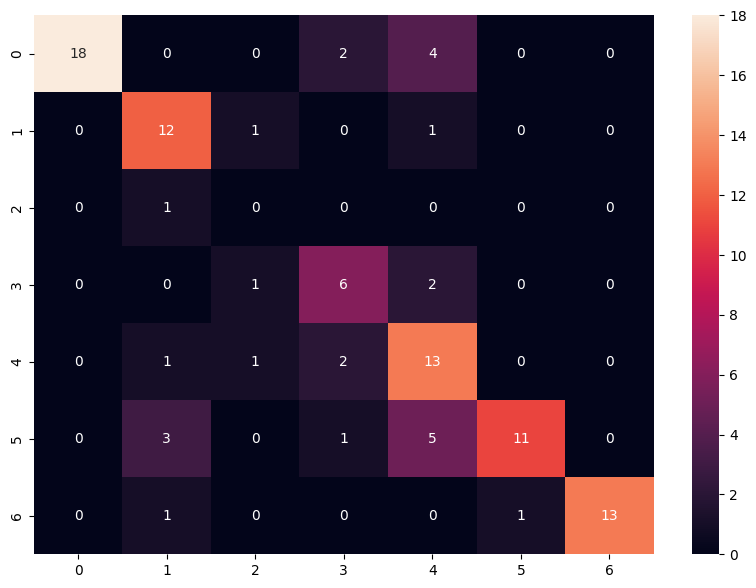

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


cm = confusion_matrix(test_labels, pred_labels)

plt.figure(figsize = (10,7))
sns.heatmap(cm, annot=True)



In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score


recall = recall_score(test_labels, pred_labels, average='macro')
f1 = f1_score(test_labels.to_numpy(), pred_labels, average='macro')
acc = accuracy_score(test_labels.to_numpy(), pred_labels)

output = f"""
<table style='font-size: 18px; border-collapse: collapse; width: 60%;'>
	<tbody>
		<tr style='border-bottom:1px solid #ddd; background-color: #6e457a;'>
			<td>RECALL</td>
			<td>F1-SCORE </td>
			<td>ACC-SCORE </td>
		</tr>
		<tr>
			<td>{recall}</td>
			<td>{f1}</td>
			<td>{acc}</td>
		</tr>
	</tbody>
</table>
"""

HTML(output)

RECALL,F1-SCORE,ACC-SCORE
0.6364545818327331,0.634608843537415,0.73


In [ ]:
SAMPLE_SIZE = 20
test_df = df_full.iloc[:100,]


def check_mark(row):
  label = f"{row.emotion_predicted} ✅ " if row.emotion_predicted == row.emotion else f"{row.emotion_predicted} ❌"
  return label

test_df['emotion_predicted'] = pred_labels
test_df['emotion_predicted'] = test_df.apply(lambda row: check_mark(row), axis=1)

table_with_sound(test_df.sample(SAMPLE_SIZE), pred=True)



<ipython-input-16-b58741f51701>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['emotion_predicted'] = pred_labels
<ipython-input-16-b58741f51701>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['emotion_predicted'] = test_df.apply(lambda row: check_mark(row), axis=1)
